## **Loading Libraries & Other Necessary Functions**

In [1]:
# Import OS libraries
import os
import itertools

# Data handling tools
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm
import cv2
import os
import imutils
import tensorflow as tf
import keras


In [2]:
import matplotlib.image as mpimg
%matplotlib inline
import random
from IPython.display import Image

In [3]:
from google.colab import files
from io import BytesIO
# Display images.
from IPython.display import display
from PIL import ImageEnhance
from PIL import Image

In [4]:
!pip install Pillow

In [5]:

from glob import glob
from tensorflow.keras.models import Model

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix , classification_report

from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense,  BatchNormalization, Activation, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam , Adamax
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Dense

In [6]:
import torch
import torchvision
from torchvision import datasets, transforms
import cv2

**Vgg16 Related Info**

In [7]:
inception = tf.keras.applications.DenseNet121(include_top=False, weights='imagenet', input_shape=(224, 224, 3))

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [8]:
for layer in inception.layers:
   layer.trainable=False

In [9]:
import os
import shutil

In [10]:
inception.summary()

Model: "densenet121"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 56, 56, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 56, 56, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 56, 56, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block2_0_bn    

 Total params: 7,037,504 (26.85 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 7,037,504 (26.85 MB)

In [11]:
for layer in inception.layers:
    print(layer.name, layer.trainable)

input_layer False
zero_padding2d False
conv1_conv False
conv1_bn False
conv1_relu False
zero_padding2d_1 False
pool1 False
conv2_block1_0_bn False
conv2_block1_0_relu False
conv2_block1_1_conv False
conv2_block1_1_bn False
conv2_block1_1_relu False
conv2_block1_2_conv False
conv2_block1_concat False
conv2_block2_0_bn False
conv2_block2_0_relu False
conv2_block2_1_conv False
conv2_block2_1_bn False
conv2_block2_1_relu False
conv2_block2_2_conv False
conv2_block2_concat False
conv2_block3_0_bn False
conv2_block3_0_relu False
conv2_block3_1_conv False
conv2_block3_1_bn False
conv2_block3_1_relu False
conv2_block3_2_conv False
conv2_block3_concat False
conv2_block4_0_bn False
conv2_block4_0_relu False
conv2_block4_1_conv False
conv2_block4_1_bn False
conv2_block4_1_relu False
conv2_block4_2_conv False
conv2_block4_concat False
conv2_block5_0_bn False
conv2_block5_0_relu False
conv2_block5_1_conv False
conv2_block5_1_bn False
conv2_block5_1_relu False
conv2_block5_2_conv False
conv2_block5_

**Mounting Drive**

In [12]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Loading Training & Testing Sets**

In [ ]:
test_set = '/content/drive/MyDrive/MRI data Ashif_zahin/Testing'
train_set='/content/drive/MyDrive/MRI data Ashif_zahin/Training'

In [13]:
test_set = '/content/drive/MyDrive/Dataset/Testing'
train_set='/content/drive/MyDrive/Dataset/Training'

In [14]:
def data(dataset_path):
    images = []
    labels = []
    for subfolder in os.listdir(dataset_path):
        subfolder_path = os.path.join(dataset_path, subfolder)
        if not os.path.isdir(subfolder_path):
            continue
        for image_filename in os.listdir(subfolder_path):
            if image_filename.endswith(".jpg"):
                image_path = os.path.join(subfolder_path, image_filename)
                images.append(image_path)
                labels.append(subfolder)
    df = pd.DataFrame({'image': images, 'label': labels})
    return df

In [15]:
def get_folder(test_folder):
    plt.figure(figsize=(20,20))
    for i in range(3):
        file = random.choice(os.listdir(test_folder))
        image_path= os.path.join(test_folder, file)
        img=mpimg.imread(image_path)
        ax=plt.subplot(3,3,i+1)
        ax.title.set_text(file)
        plt.imshow(img)

**Dont run this line of codes**

Text(0.5, 1.0, 'GLioma')

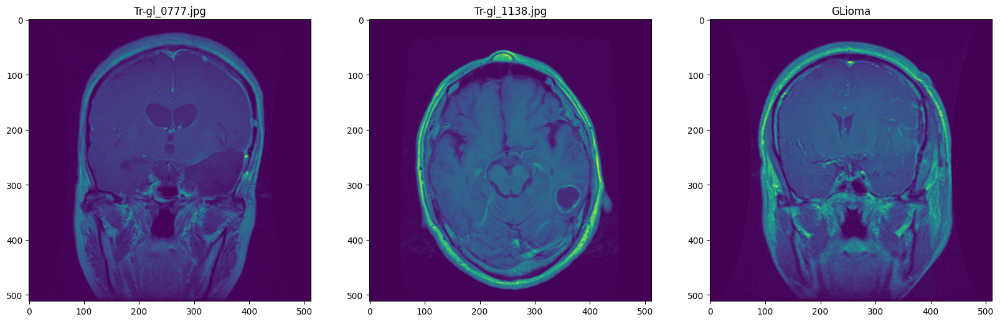

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Training/glioma")
plt.title('GLioma')

Text(0.5, 1.0, 'Meningioma')

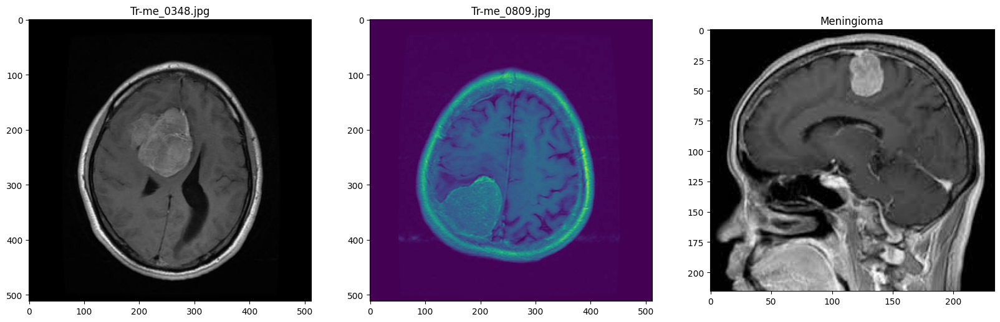

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Training/meningioma")
plt.title('Meningioma')

Text(0.5, 1.0, 'No Tumor')

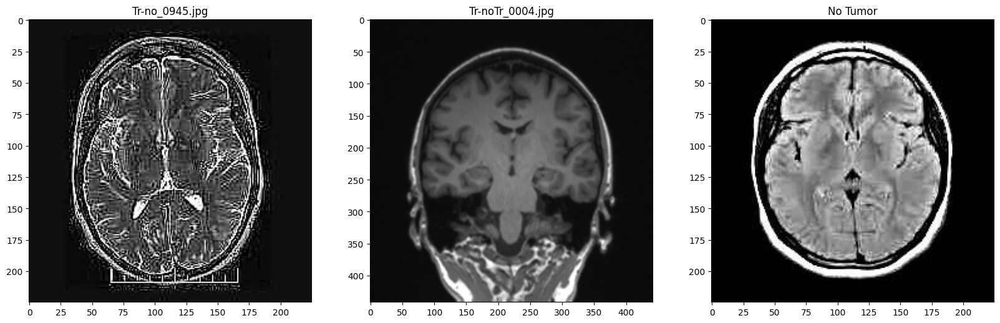

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Training/notumor")
plt.title('No Tumor')

Text(0.5, 1.0, 'Pituitary')

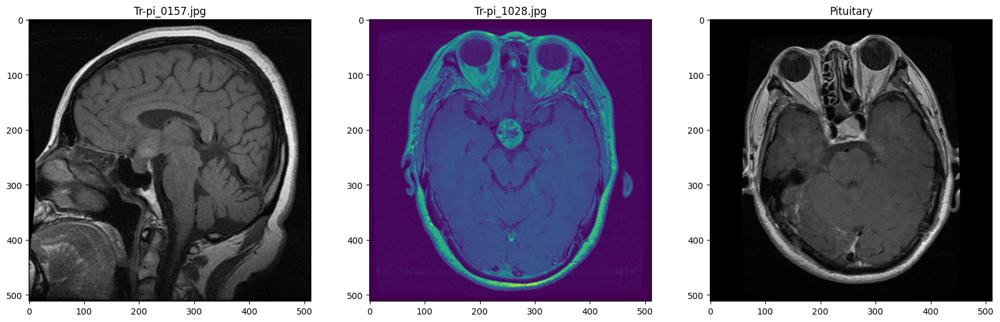

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Training/pituitary")
plt.title('Pituitary')

Text(0.5, 1.0, 'GLioma')

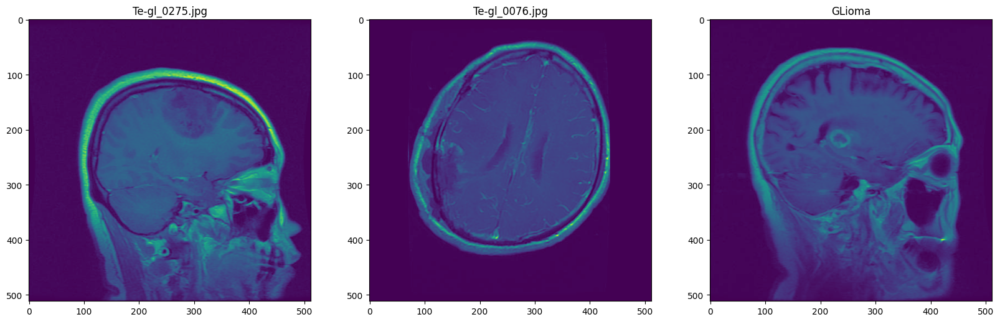

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Testing/glioma")
plt.title('GLioma')

Text(0.5, 1.0, 'Meningioma')

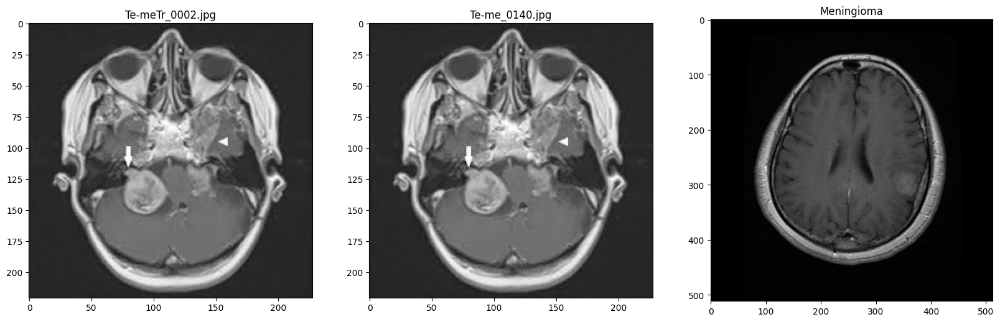

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Testing/meningioma")
plt.title('Meningioma')

Text(0.5, 1.0, 'No Tumor')

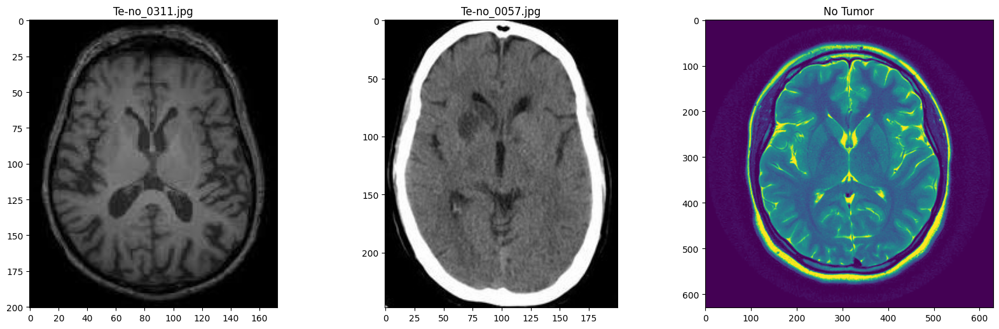

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Testing/notumor")
plt.title('No Tumor')

Text(0.5, 1.0, 'Pituitary')

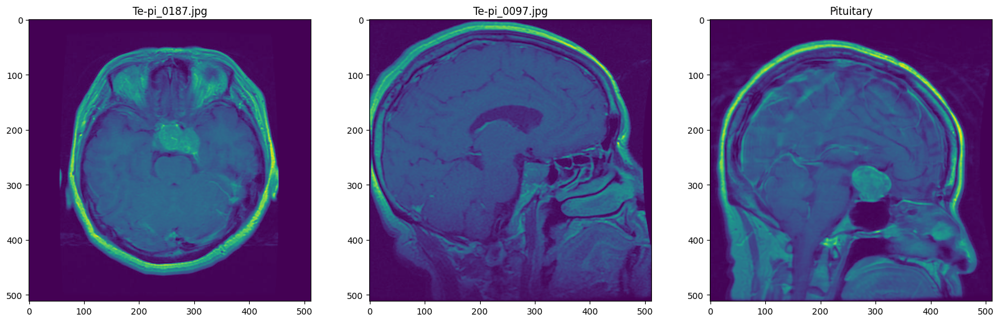

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Testing/pituitary")
plt.title('Pituitary')

Run again from here

In [16]:
test=data('/content/drive/MyDrive/Dataset/Testing')

In [17]:
train=data('/content/drive/MyDrive/Dataset/Training')

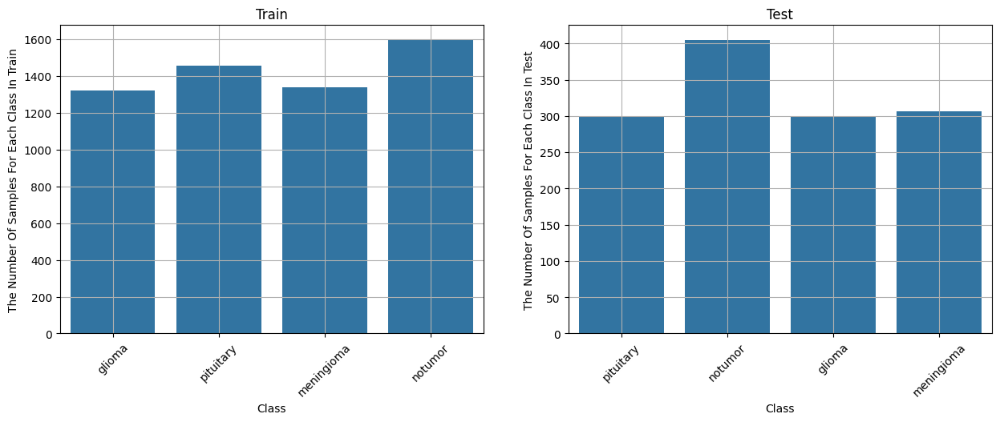

In [18]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
ax = sns.countplot(x=train.label)
ax.set_xlabel("Class")
ax.set_ylabel("The Number Of Samples For Each Class In Train")
plt.title('Train')
plt.grid(True)
plt.xticks(rotation=45)
plt.subplot(1,2,2)
ax = sns.countplot(x=test.label)
ax.set_xlabel("Class")
ax.set_ylabel("The Number Of Samples For Each Class In Test")
plt.title('Test')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

**Preprocessing The Image**

In [19]:
labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

x_train = [] # training images.
y_train  = [] # training labels.
x_test = [] # testing images.
y_test = [] # testing labels.

image_size = 224


for label in labels:
    trainPath = os.path.join(train_set,label)
    for file in tqdm(os.listdir(trainPath)):
        image = cv2.imread(os.path.join(trainPath, file),0)# load images in gray.
        image = Image.fromarray(image)# Convert the image to a PIL image.
        contrast = ImageEnhance.Contrast(image)  # improving contrast
        image = contrast.enhance(1.2)
        brightness = ImageEnhance.Brightness(image)  # improving brightness
        image = brightness.enhance(1.1)
        sharpness = ImageEnhance.Sharpness(image)  # improving Sharpness
        image = sharpness.enhance(1.2)
        image = np.array(image)
        image = cv2.bilateralFilter(image, 2, 50, 50) # remove images noise.
        image = cv2.applyColorMap(image, cv2.COLORMAP_BONE) # produce a pseudocolored image.
        image = cv2.resize(image, (image_size, image_size)) # resize images into 224*224.

        x_train.append(image)
        y_train.append(labels.index(label))

    testPath = os.path.join(test_set,label)
    for file in tqdm(os.listdir(testPath)):
        image = cv2.imread(os.path.join(testPath, file),0)
        image = Image.fromarray(image)# Convert the image to a PIL image.
        contrast = ImageEnhance.Contrast(image)  # improving contrast
        image = contrast.enhance(1.2)
        brightness = ImageEnhance.Brightness(image)  # improving brightness
        image = brightness.enhance(1.1)
        sharpness = ImageEnhance.Sharpness(image)  # improving Sharpness
        image = sharpness.enhance(1.2)
        image = np.array(image)
        image = cv2.bilateralFilter(image, 2, 50, 50)
        image = cv2.applyColorMap(image, cv2.COLORMAP_BONE)
        image = cv2.resize(image, (image_size, image_size))
        x_test.append(image)
        y_test.append(labels.index(label))

100%|██████████| 300/300 [00:10<00:00, 27.48it/s]


In [20]:
def crop_img(img):
	"""
	Finds the extreme points on the image and crops the rectangular out of them
	"""
	gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
	gray = cv2.GaussianBlur(gray, (3, 3), 0)

	# threshold the image, then perform a series of erosions +
	# dilations to remove any small regions of noise
	thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
	thresh = cv2.erode(thresh, None, iterations=2)
	thresh = cv2.dilate(thresh, None, iterations=2)

	# find contours in thresholded image, then grab the largest one
	cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
	cnts = imutils.grab_contours(cnts)
	c = max(cnts, key=cv2.contourArea)

	# find the extreme points
	extLeft = tuple(c[c[:, :, 0].argmin()][0])
	extRight = tuple(c[c[:, :, 0].argmax()][0])
	extTop = tuple(c[c[:, :, 1].argmin()][0])
	extBot = tuple(c[c[:, :, 1].argmax()][0])
	ADD_PIXELS = 0
	new_img = img[extTop[1]-ADD_PIXELS:extBot[1]+ADD_PIXELS, extLeft[0]-ADD_PIXELS:extRight[0]+ADD_PIXELS].copy()

	return new_img

if __name__ == "__main__":
	training = train_set
	testing = test_set
	training_dir = os.listdir(training)
	testing_dir = os.listdir(testing)
	IMG_SIZE = 224

	for dir in training_dir:
		save_path = 'cleaned/Training/'+ dir
		path = os.path.join(training,dir)
		image_dir = os.listdir(path)
		for img in image_dir:
			image = cv2.imread(os.path.join(path,img))
			new_img = crop_img(image)
			new_img = cv2.resize(new_img,(IMG_SIZE,IMG_SIZE))
			if not os.path.exists(save_path):
				os.makedirs(save_path)
			cv2.imwrite(save_path+'/'+img, new_img)

	for dir in testing_dir:
		save_path = 'cleaned/Testing/'+ dir
		path = os.path.join(testing,dir)
		image_dir = os.listdir(path)
		for img in image_dir:
			image = cv2.imread(os.path.join(path,img))
			new_img = crop_img(image)
			new_img = cv2.resize(new_img,(IMG_SIZE,IMG_SIZE))
			if not os.path.exists(save_path):
				os.makedirs(save_path)
			cv2.imwrite(save_path+'/'+img, new_img)

**Checking For Path Here We have 4 Labels**

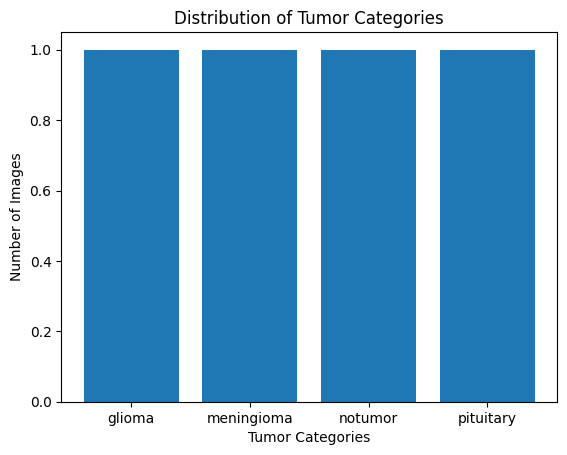

In [21]:
unique_labels, counts = np.unique(labels, return_counts=True)
plt.bar(unique_labels, counts)
plt.xlabel('Tumor Categories')
plt.ylabel('Number of Images')
plt.title('Distribution of Tumor Categories')
plt.show()

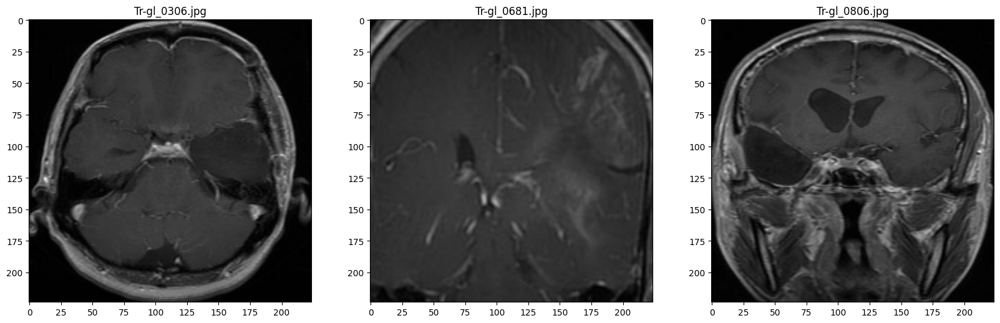

In [ ]:
get_folder("/content/cleaned/Training/glioma")

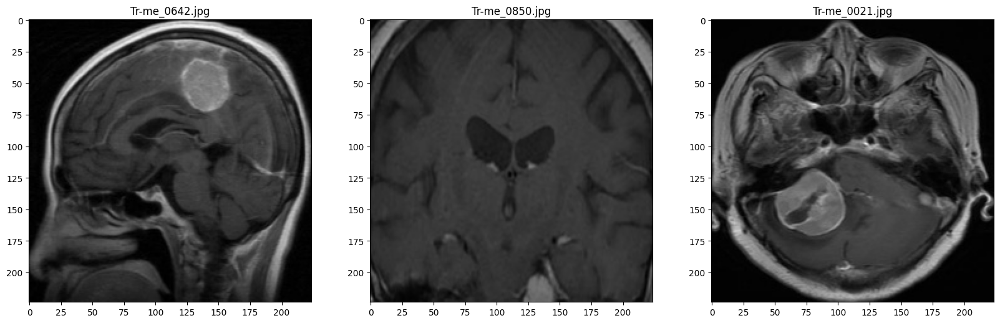

In [ ]:
get_folder("/content/cleaned/Training/meningioma")

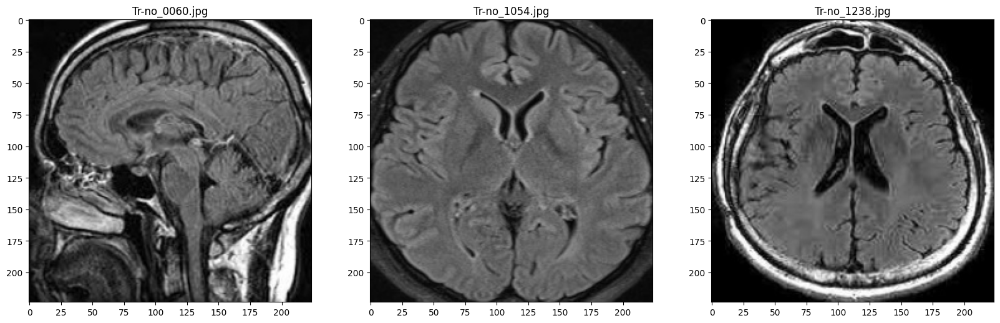

In [ ]:
get_folder("/content/cleaned/Training/notumor")

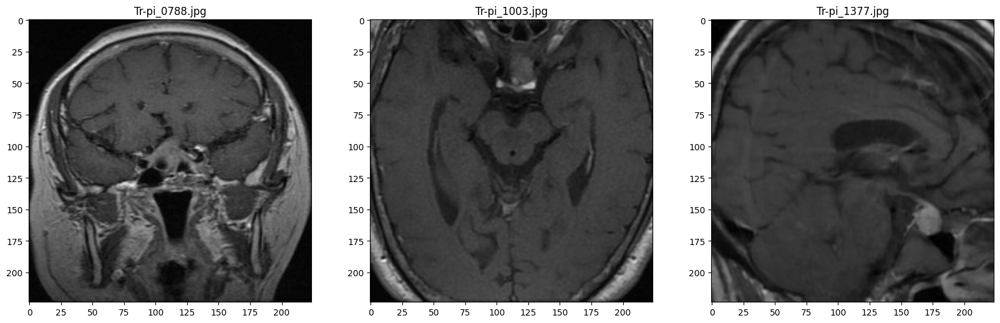

In [ ]:
get_folder("/content/cleaned/Training/pituitary")

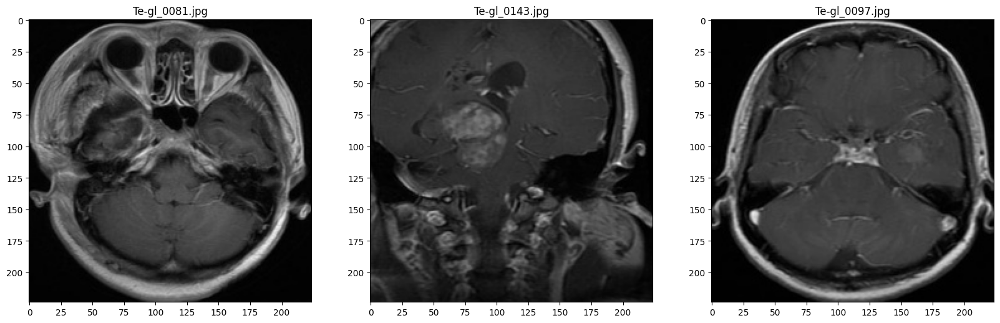

In [ ]:
get_folder("/content/cleaned/Testing/glioma")

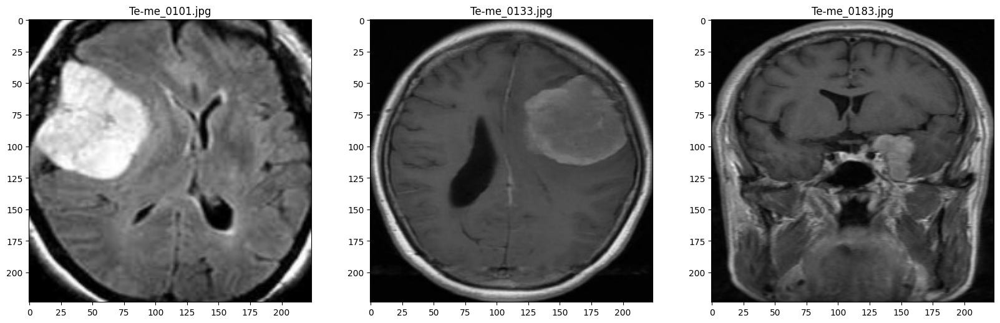

In [ ]:
get_folder("/content/cleaned/Testing/meningioma")

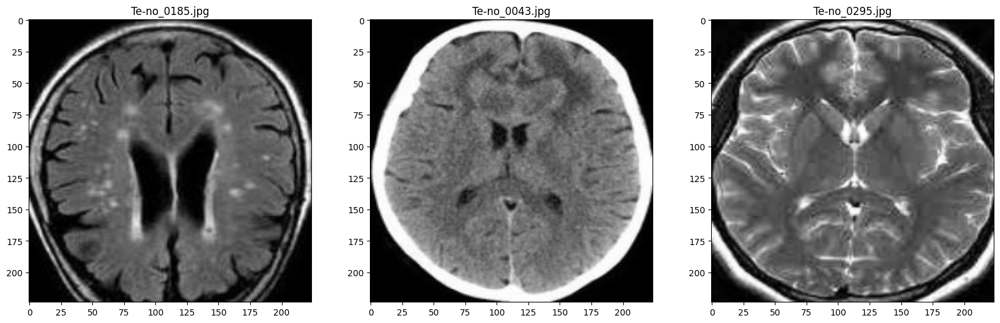

In [ ]:
get_folder("/content/cleaned/Testing/notumor")

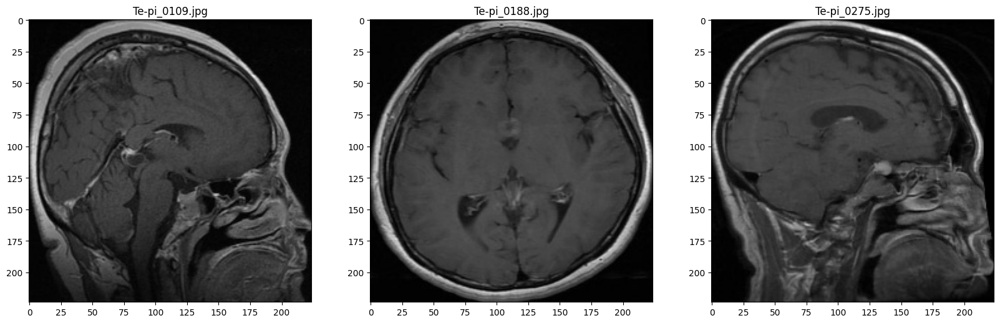

In [ ]:
get_folder("/content/cleaned/Testing/pituitary")

In [22]:
folders_train=glob('/content//cleaned/Training/*')
folders_train

['/content//cleaned/Training/glioma',
 '/content//cleaned/Training/notumor',
 '/content//cleaned/Training/pituitary',
 '/content//cleaned/Training/meningioma']

In [23]:
folders_test=glob('/content//cleaned/Testing/*')
folders_test

['/content//cleaned/Testing/glioma',
 '/content//cleaned/Testing/notumor',
 '/content//cleaned/Testing/pituitary',
 '/content//cleaned/Testing/meningioma']

In [24]:
len(folders_train)

4

**Training the Dataset**

In [25]:
x= tf.keras.layers.GlobalAveragePooling2D()(inception.output)
x= Dense(128,activation='relu')(x)
x= Dropout(0.2)(x)

In [26]:
prediction=Dense(4, activation='softmax')(x)

inception.input

<KerasTensor shape=(None, 224, 224, 3), dtype=float32, sparse=None, name=keras_tensor>

In [27]:
model=Model(inception.input, prediction)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 56, 56, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 56, 56, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 56, 56, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block2_0_bn    

 Total params: 7,169,220 (27.35 MB)

 Trainable params: 131,716 (514.52 KB)

 Non-trainable params: 7,037,504 (26.85 MB)

In [28]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy', keras.metrics.SpecificityAtSensitivity(0.5), keras.metrics.AUC()])

**For Normalizing**

In [29]:
# train_datagen=ImageDataGenerator(rescale=1./255,
#                                  shear_range=0.2,
#                                  zoom_range=0.2,
#                                  horizontal_flip=False)

datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)


In [ ]:
# test_datagen=ImageDataGenerator(rescale=1./255)


In [30]:
# train_set=train_datagen.flow_from_directory('/content//cleaned/Training',
#                                             target_size=(224,224),
#                                             batch_size=64,
#                                             class_mode='categorical'
#                                             )
train_set = datagen.flow_from_directory(
    '/content//cleaned/Training',
    target_size=(224, 224),
    batch_size=24,
    class_mode='categorical',
    subset='training'
)

Found 4571 images belonging to 4 classes.


**Creating Batches**

In [31]:
# test_set=test_datagen.flow_from_directory('/content//cleaned/Testing',
#                                             target_size=(224,224),
#                                             batch_size=64,
#                                             class_mode='categorical'
#                                             )

test_set = ImageDataGenerator(rescale=1./255).flow_from_directory(
    '/content//cleaned/Testing',
    target_size=(224, 224),
    batch_size=24,
    class_mode='categorical',
    shuffle=False
)

Found 1311 images belonging to 4 classes.


**Callback Function**

In [32]:
checkpoint_filepath = '/tmp/ckpt/checkpoint.weights.h5'
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

In [33]:
callback =tf.keras.callbacks.BackupAndRestore(backup_dir="/tmp/backup")

In [34]:
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

In [35]:
r=model.fit(train_set,validation_data=test_set,
                      epochs=150,
                      callbacks=[early_stop,callback,model_checkpoint_callback])

Epoch 1/150


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


191/191 ━━━━━━━━━━━━━━━━━━━━ 153s 638ms/step - accuracy: 0.6536 - auc: 0.8654 - loss: 0.8788 - specificity_at_sensitivity: 0.9318 - val_accuracy: 0.8177 - val_auc: 0.9581 - val_loss: 0.4959 - val_specificity_at_sensitivity: 0.9934
Epoch 2/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 68s 331ms/step - accuracy: 0.8374 - auc: 0.9677 - loss: 0.4271 - specificity_at_sensitivity: 0.9943 - val_accuracy: 0.8207 - val_auc: 0.9620 - val_loss: 0.4715 - val_specificity_at_sensitivity: 0.9936
Epoch 3/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 66s 330ms/step - accuracy: 0.8535 - auc: 0.9741 - loss: 0.3832 - specificity_at_sensitivity: 0.9974 - val_accuracy: 0.8436 - val_auc: 0.9656 - val_loss: 0.4654 - val_specificity_at_sensitivity: 0.9944
Epoch 4/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 82s 336ms/step - accuracy: 0.8756 - auc: 0.9773 - loss: 0.3511 - specificity_at_sensitivity: 0.9965 - val_accuracy: 0.8421 - val_auc: 0.9716 - val_loss: 0.4035 - val_specificity_at_sensitivity: 0.9967
Epoch 5/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 64

**Checking The Results**

In [36]:
df_inception = pd.DataFrame(r.history)
df_inception.tail()

,accuracy,auc,loss,specificity_at_sensitivity,val_accuracy,val_auc,val_loss,val_specificity_at_sensitivity
27,0.923649,0.991657,0.204826,0.999490,0.901602,0.984119,0.306498,0.998983
28,0.930650,0.992875,0.189414,0.999635,0.848207,0.975013,0.450724,0.997203
29,0.924087,0.992049,0.200258,0.999635,0.871854,0.979570,0.376111,0.998474
30,0.922336,0.991941,0.201240,0.999490,0.882532,0.982568,0.344325,0.998729
31,0.929337,0.993289,0.183334,0.999635,0.875667,0.978564,0.392954,0.997712


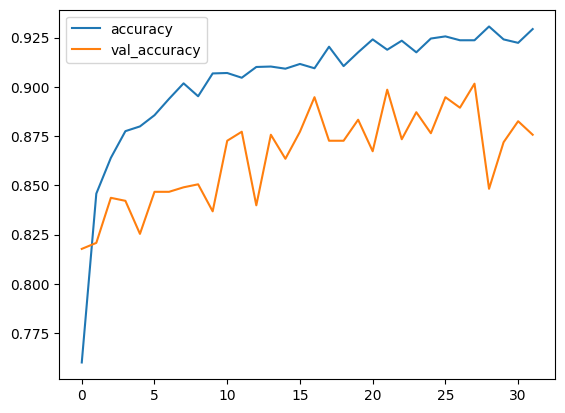

In [37]:
df_inception[["accuracy","val_accuracy"]].plot();

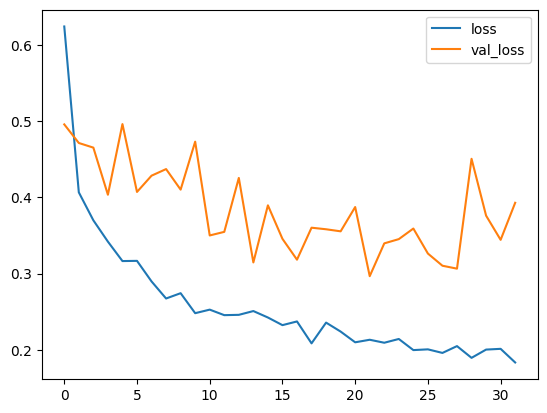

In [38]:
df_inception[["loss","val_loss"]].plot();

In [39]:
hist_=pd.DataFrame(r.history)
hist_


,accuracy,auc,loss,specificity_at_sensitivity,val_accuracy,val_auc,val_loss,val_specificity_at_sensitivity
0,0.760009,0.933755,0.624407,0.985561,0.817696,0.958051,0.495864,0.993389
1,0.845767,0.970510,0.406671,0.995625,0.820747,0.962015,0.471458,0.993644
2,0.863925,0.975794,0.369953,0.997083,0.843631,0.965592,0.465371,0.994406
3,0.877488,0.978711,0.341965,0.996864,0.842105,0.971602,0.403520,0.996695
4,0.879895,0.981699,0.316464,0.997229,0.825324,0.965965,0.496278,0.996695
5,0.885583,0.981252,0.316728,0.997229,0.846682,0.972200,0.407201,0.995678
6,0.893896,0.984342,0.289732,0.998250,0.846682,0.971544,0.428553,0.995932
7,0.901772,0.986744,0.267321,0.999052,0.848970,0.969701,0.437205,0.996186
8,0.895209,0.986059,0.274283,0.999052,0.850496,0.974881,0.410236,0.997457
9,0.906804,0.988401,0.248041,0.999198,0.836766,0.968697,0.473209,0.998474


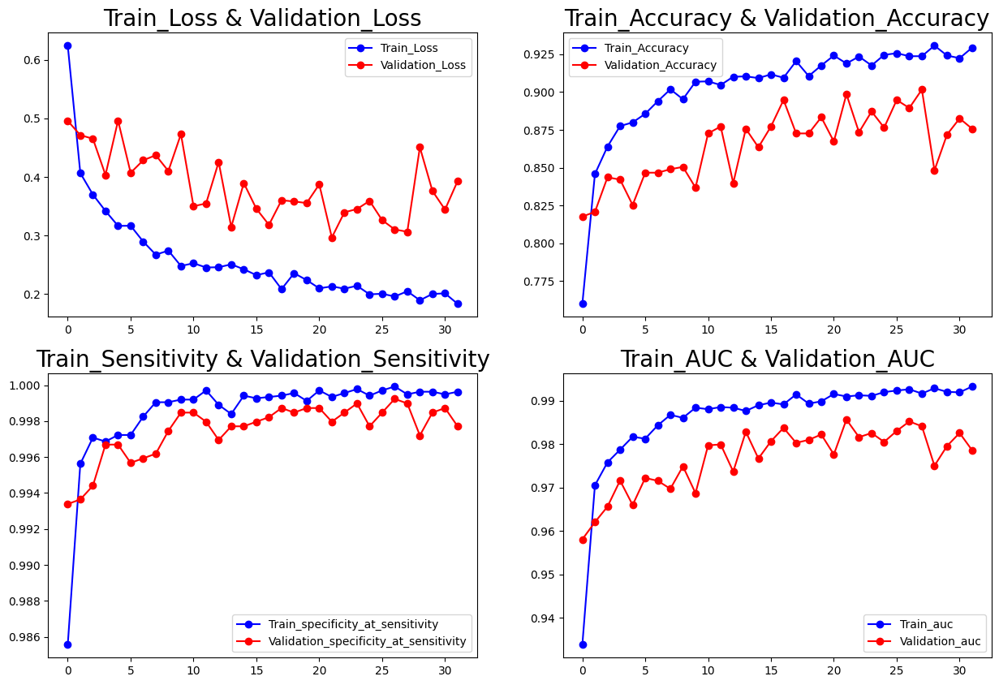

In [40]:
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.plot(hist_['loss'],'b-o',label='Train_Loss')
plt.plot(hist_['val_loss'],'r-o',label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(2,2,2)
plt.plot(hist_['accuracy'],'b-o',label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],'r-o',label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.subplot(2,2,3)
plt.plot(hist_['specificity_at_sensitivity'],'b-o',label='Train_specificity_at_sensitivity')
plt.plot(hist_['val_specificity_at_sensitivity'],'r-o',label='Validation_specificity_at_sensitivity')
plt.title('Train_Sensitivity & Validation_Sensitivity',fontsize=20)
plt.legend()
plt.subplot(2,2,4)
plt.plot(hist_['auc'],'b-o',label='Train_auc')
plt.plot(hist_['val_auc'],'r-o',label='Validation_auc')
plt.title('Train_AUC & Validation_AUC',fontsize=20)
plt.legend()
plt.show()

In [41]:
score, acc ,sensitivity,auc= model.evaluate(test_set)
print('Test Loss =', score)
print('Test Accuracy =', acc)
print('Test Sensitivity =', sensitivity)
print('Test AUC =', auc)

55/55 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.8268 - auc: 0.9673 - loss: 0.4762 - specificity_at_sensitivity: 0.9937
Test Loss = 0.39295393228530884
Test Accuracy = 0.8756674528121948
Test Sensitivity = 0.9977116584777832
Test AUC = 0.978564441204071


In [42]:
y_test =test_set.classes
predictions = model.predict(test_set)

# Find the class with the highest predicted probability for each sample
y_pred = np.argmax(predictions, axis=1)

y_test = np.ravel(y_test)
df = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})
print(df)

55/55 ━━━━━━━━━━━━━━━━━━━━ 21s 218ms/step
      Actual  Prediction
0          0           0
1          0           0
2          0           0
3          0           1
4          0           0
...      ...         ...
1306       3           3
1307       3           3
1308       3           3
1309       3           3
1310       3           3

[1311 rows x 2 columns]


array([[248,  39,   0,  13],
       [ 17, 218,   3,  68],
       [  5,  12, 383,   5],
       [  1,   0,   0, 299]])

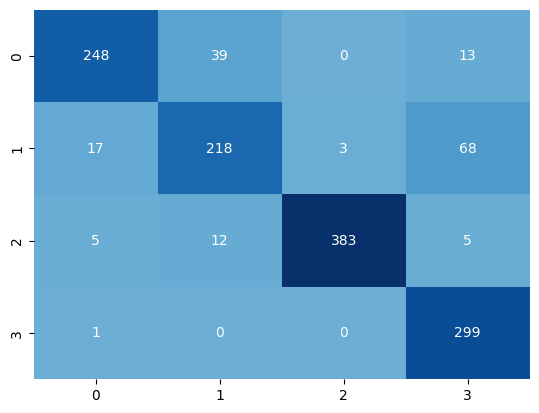

In [45]:
CM = confusion_matrix(y_test,y_pred)
sns.heatmap(CM,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [44]:
ClassificationReport = classification_report(y_test,y_pred)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       0.92      0.83      0.87       300
           1       0.81      0.71      0.76       306
           2       0.99      0.95      0.97       405
           3       0.78      1.00      0.87       300

    accuracy                           0.88      1311
   macro avg       0.87      0.87      0.87      1311
weighted avg       0.88      0.88      0.87      1311

Classification Report is :                precision    recall  f1-score   support

           0       0.92      0.83      0.87       300
           1       0.81      0.71      0.76       306
           2       0.99      0.95      0.97       405
           3       0.78      1.00      0.87       300

    accuracy                           0.88      1311
   macro avg       0.87      0.87      0.87      1311
weighted avg       0.88      0.88      0.87      1311



## **Just taking tumor categories**

In [ ]:
import shutil
import os

In [ ]:
drop=('/content//cleaned/Training/notumor')
shutil.rmtree(drop)

In [ ]:
folders_train=glob('/content//cleaned/Training/*')
folders_train

['/content//cleaned/Training/glioma',
 '/content//cleaned/Training/pituitary',
 '/content//cleaned/Training/meningioma']

In [ ]:
shutil.rmtree('/content//cleaned/Testing/notumor')

In [ ]:
folders_test=glob('/content//cleaned/Testing/*')
folders_test

['/content//cleaned/Testing/glioma',
 '/content//cleaned/Testing/pituitary',
 '/content//cleaned/Testing/meningioma']

In [ ]:
len(folders_train)

3

In [ ]:
len(folders_test)

3

In [ ]:
x= tf.keras.layers.GlobalAveragePooling2D()(inception.output)
x= Dense(128,activation='relu')(x)
x= Dropout(0.2)(x)

In [ ]:
prediction=Dense(3, activation='softmax')(x)

inception.input

<KerasTensor shape=(None, 224, 224, 3), dtype=float32, sparse=None, name=keras_tensor>

In [ ]:
model1=Model(inception.input, prediction)
model1.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 56, 56, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 56, 56, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 56, 56, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block2_0_bn    

 Total params: 7,169,091 (27.35 MB)

 Trainable params: 131,587 (514.01 KB)

 Non-trainable params: 7,037,504 (26.85 MB)

In [ ]:
model1.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy', keras.metrics.SpecificityAtSensitivity(0.5), keras.metrics.AUC()])

In [ ]:
datagen1 = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)


In [ ]:
train_set1 = datagen1.flow_from_directory(
    '/content//cleaned/Training',
    target_size=(224, 224),
    batch_size=24,
    class_mode='categorical',
    subset='training'
)

Found 3295 images belonging to 3 classes.


In [ ]:
test_set1 = ImageDataGenerator(rescale=1./255).flow_from_directory(
    '/content//cleaned/Testing',
    target_size=(224, 224),
    batch_size=24,
    class_mode='categorical',
    shuffle=False
)

Found 906 images belonging to 3 classes.


In [ ]:
r=model1.fit(train_set1,validation_data=test_set1,
                      epochs=150,
                      callbacks=[early_stop,callback,model_checkpoint_callback])

Epoch 1/150


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


138/138 ━━━━━━━━━━━━━━━━━━━━ 135s 746ms/step - accuracy: 0.6161 - auc: 0.7952 - loss: 0.8454 - specificity_at_sensitivity: 0.8662 - val_accuracy: 0.7936 - val_auc: 0.9265 - val_loss: 0.5207 - val_specificity_at_sensitivity: 0.9757
Epoch 2/150
138/138 ━━━━━━━━━━━━━━━━━━━━ 70s 342ms/step - accuracy: 0.8056 - auc: 0.9380 - loss: 0.4761 - specificity_at_sensitivity: 0.9820 - val_accuracy: 0.8157 - val_auc: 0.9332 - val_loss: 0.5026 - val_specificity_at_sensitivity: 0.9779
Epoch 3/150
138/138 ━━━━━━━━━━━━━━━━━━━━ 80s 327ms/step - accuracy: 0.8349 - auc: 0.9527 - loss: 0.4167 - specificity_at_sensitivity: 0.9893 - val_accuracy: 0.7991 - val_auc: 0.9382 - val_loss: 0.4892 - val_specificity_at_sensitivity: 0.9873
Epoch 4/150
138/138 ━━━━━━━━━━━━━━━━━━━━ 48s 334ms/step - accuracy: 0.8409 - auc: 0.9559 - loss: 0.4004 - specificity_at_sensitivity: 0.9899 - val_accuracy: 0.7881 - val_auc: 0.9339 - val_loss: 0.5396 - val_specificity_at_sensitivity: 0.9879
Epoch 5/150
138/138 ━━━━━━━━━━━━━━━━━━━━ 47

In [ ]:
df_inception = pd.DataFrame(r.history)
df_inception.tail()

,accuracy,auc,loss,specificity_at_sensitivity,val_accuracy,val_auc,val_loss,val_specificity_at_sensitivity
37,0.917147,0.987182,0.210912,0.999241,0.896247,0.975537,0.315669,0.996137
38,0.914719,0.986615,0.214187,0.999241,0.891832,0.977453,0.287388,0.998896
39,0.915630,0.986011,0.220108,0.999090,0.847682,0.970437,0.376187,0.999448
40,0.920486,0.986665,0.212255,0.998483,0.837748,0.961802,0.431092,0.997792
41,0.920486,0.987331,0.208146,0.998634,0.880795,0.976499,0.317034,0.999448


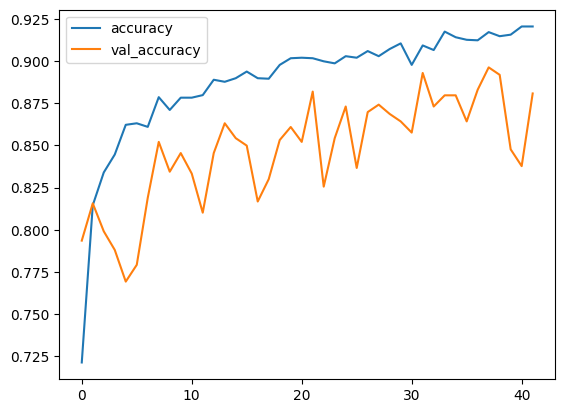

In [ ]:
df_inception[["accuracy","val_accuracy"]].plot();

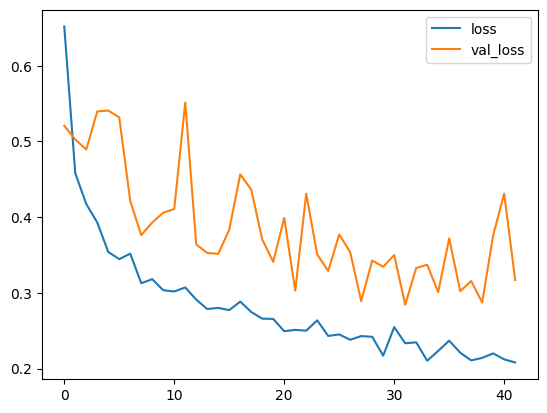

In [ ]:
df_inception[["loss","val_loss"]].plot();

In [ ]:
hist_=pd.DataFrame(r.history)
hist_

,accuracy,auc,loss,specificity_at_sensitivity,val_accuracy,val_auc,val_loss,val_specificity_at_sensitivity
0,0.721396,0.884311,0.651772,0.954021,0.793598,0.926466,0.520656,0.975717
1,0.814568,0.942881,0.458027,0.985281,0.815673,0.933239,0.502571,0.977925
2,0.833991,0.952190,0.417402,0.987709,0.799117,0.938215,0.489247,0.987307
3,0.844613,0.957288,0.392959,0.989530,0.788079,0.933921,0.539575,0.987859
4,0.862215,0.965359,0.354065,0.992868,0.769316,0.928629,0.540783,0.986755
5,0.863126,0.966888,0.344566,0.994082,0.779249,0.936387,0.531666,0.986755
6,0.861001,0.965441,0.351797,0.991654,0.818985,0.953633,0.421276,0.989514
7,0.878604,0.972712,0.312815,0.995903,0.852097,0.962756,0.376313,0.993929
8,0.871017,0.971751,0.318167,0.996055,0.834437,0.960039,0.392959,0.993929
9,0.878300,0.974063,0.303535,0.996358,0.845475,0.959966,0.405898,0.990066


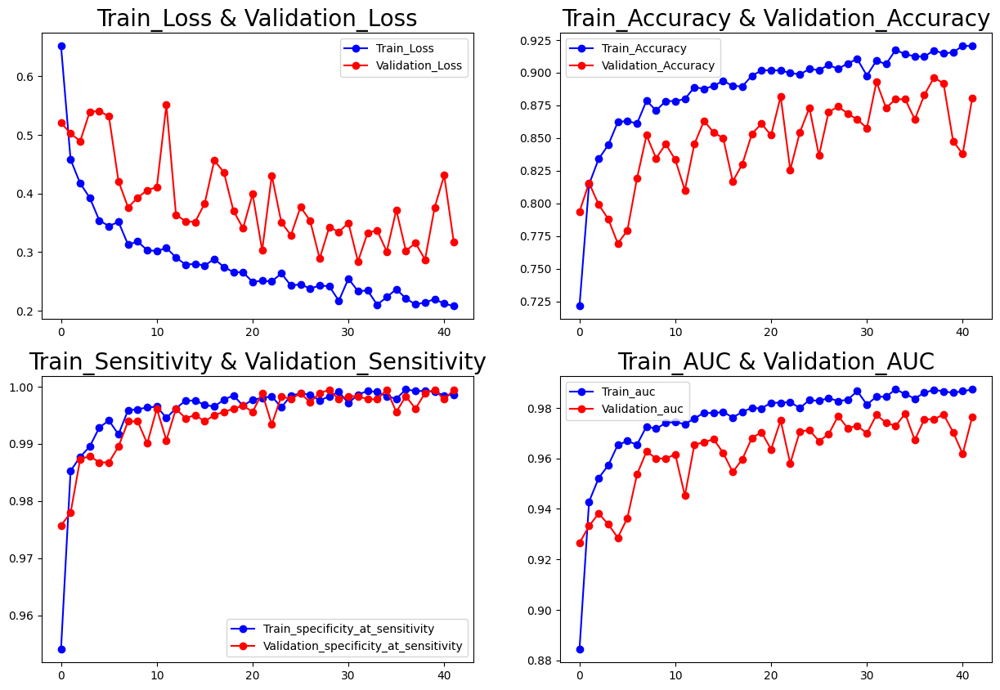

In [ ]:
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.plot(hist_['loss'],'b-o',label='Train_Loss')
plt.plot(hist_['val_loss'],'r-o',label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(2,2,2)
plt.plot(hist_['accuracy'],'b-o',label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],'r-o',label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.subplot(2,2,3)
plt.plot(hist_['specificity_at_sensitivity'],'b-o',label='Train_specificity_at_sensitivity')
plt.plot(hist_['val_specificity_at_sensitivity'],'r-o',label='Validation_specificity_at_sensitivity')
plt.title('Train_Sensitivity & Validation_Sensitivity',fontsize=20)
plt.legend()
plt.subplot(2,2,4)
plt.plot(hist_['auc'],'b-o',label='Train_auc')
plt.plot(hist_['val_auc'],'r-o',label='Validation_auc')
plt.title('Train_AUC & Validation_AUC',fontsize=20)
plt.legend()
plt.show()

In [ ]:
score,acc,sensitivity,auc= model1.evaluate(test_set1)
print('Test Loss =', score)
print('Test Accuracy =', acc)
print('Test Sensitivity =', sensitivity)
print('Test AUC =', auc)

38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - accuracy: 0.8661 - auc: 0.9715 - loss: 0.3366 - specificity_at_sensitivity: 0.9981
Test Loss = 0.3170338571071625
Test Accuracy = 0.8807947039604187
Test Sensitivity = 0.9994481205940247
Test AUC = 0.976499080657959


In [ ]:
y_test1 =test_set1.classes
predictions = model1.predict(test_set1)

# Find the class with the highest predicted probability for each sample
y_pred1 = np.argmax(predictions, axis=1)

y_test1 = np.ravel(y_test1)
df = pd.DataFrame({'Actual': y_test1, 'Prediction': y_pred1})
print(df)

38/38 ━━━━━━━━━━━━━━━━━━━━ 19s 265ms/step
     Actual  Prediction
0         0           0
1         0           0
2         0           0
3         0           1
4         0           0
..      ...         ...
901       2           2
902       2           2
903       2           2
904       2           2
905       2           2

[906 rows x 2 columns]


array([[252,  41,   7],
       [ 14, 251,  41],
       [  3,   2, 295]])

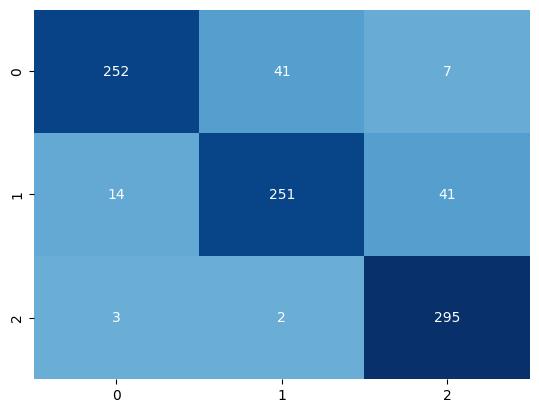

In [ ]:
CM = confusion_matrix(y_test1,y_pred1)
sns.heatmap(CM,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [ ]:
ClassificationReport = classification_report(y_test1,y_pred1)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       0.94      0.84      0.89       300
           1       0.85      0.82      0.84       306
           2       0.86      0.98      0.92       300

    accuracy                           0.88       906
   macro avg       0.88      0.88      0.88       906
weighted avg       0.88      0.88      0.88       906

Classification Report is :                precision    recall  f1-score   support

           0       0.94      0.84      0.89       300
           1       0.85      0.82      0.84       306
           2       0.86      0.98      0.92       300

    accuracy                           0.88       906
   macro avg       0.88      0.88      0.88       906
weighted avg       0.88      0.88      0.88       906



## **Now With just Tumor and No tumor Category**

In [ ]:
test_set2 = '/content/drive/MyDrive/Dataset/Testing'
train_set2='/content/drive/MyDrive/Dataset/Training'

In [ ]:
test2=data('/content/drive/MyDrive/Dataset/Testing')

In [ ]:
train2=data('/content/drive/MyDrive/Dataset/Training')

In [ ]:
def data(dataset_path):
    images = []
    labels = []
    for subfolder in os.listdir(dataset_path):
        subfolder_path = os.path.join(dataset_path, subfolder)
        if not os.path.isdir(subfolder_path):
            continue
        for image_filename in os.listdir(subfolder_path):
            if image_filename.endswith(".jpg"):
                image_path = os.path.join(subfolder_path, image_filename)
                images.append(image_path)
                labels.append(subfolder)
    df = pd.DataFrame({'image': images, 'label': labels})
    return df

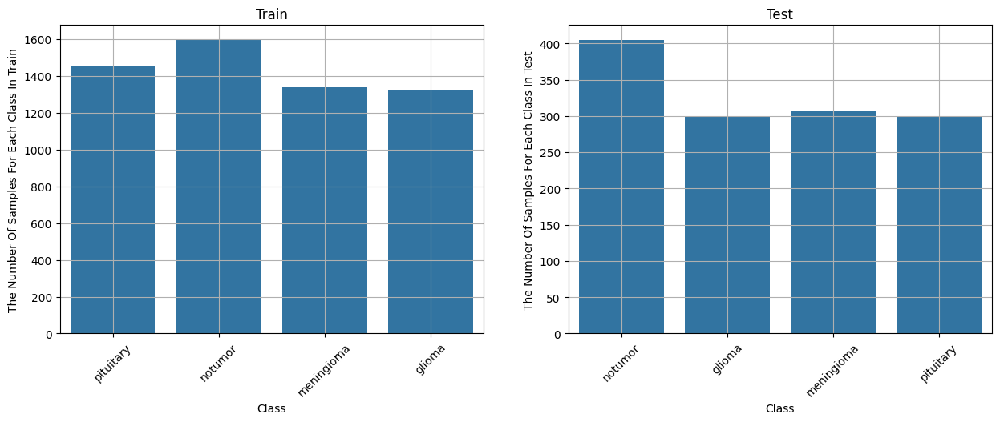

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
ax = sns.countplot(x=train2.label)
ax.set_xlabel("Class")
ax.set_ylabel("The Number Of Samples For Each Class In Train")
plt.title('Train')
plt.grid(True)
plt.xticks(rotation=45)
plt.subplot(1,2,2)
ax = sns.countplot(x=test2.label)
ax.set_xlabel("Class")
ax.set_ylabel("The Number Of Samples For Each Class In Test")
plt.title('Test')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

In [ ]:
labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

x_train = [] # training images.
y_train  = [] # training labels.
x_test = [] # testing images.
y_test = [] # testing labels.

image_size = 224


for label in labels:
    trainPath = os.path.join(train_set2,label)
    for file in tqdm(os.listdir(trainPath)):
        image = cv2.imread(os.path.join(trainPath, file),0)# load images in gray.
        image = Image.fromarray(image)# Convert the image to a PIL image.
        contrast = ImageEnhance.Contrast(image)  # improving contrast
        image = contrast.enhance(1.2)
        brightness = ImageEnhance.Brightness(image)  # improving brightness
        image = brightness.enhance(1.1)
        sharpness = ImageEnhance.Sharpness(image)  # improving Sharpness
        image = sharpness.enhance(1.2)
        image = np.array(image)
        image = cv2.bilateralFilter(image, 2, 50, 50) # remove images noise.
        image = cv2.applyColorMap(image, cv2.COLORMAP_BONE) # produce a pseudocolored image.
        image = cv2.resize(image, (image_size, image_size)) # resize images into 224*224.

        x_train.append(image)
        y_train.append(labels.index(label))

    testPath = os.path.join(test_set2,label)
    for file in tqdm(os.listdir(testPath)):
        image = cv2.imread(os.path.join(testPath, file),0)
        image = Image.fromarray(image)# Convert the image to a PIL image.
        contrast = ImageEnhance.Contrast(image)  # improving contrast
        image = contrast.enhance(1.2)
        brightness = ImageEnhance.Brightness(image)  # improving brightness
        image = brightness.enhance(1.1)
        sharpness = ImageEnhance.Sharpness(image)  # improving Sharpness
        image = sharpness.enhance(1.2)
        image = np.array(image)
        image = cv2.bilateralFilter(image, 2, 50, 50)
        image = cv2.applyColorMap(image, cv2.COLORMAP_BONE)
        image = cv2.resize(image, (image_size, image_size))
        x_test.append(image)
        y_test.append(labels.index(label))

100%|██████████| 300/300 [00:04<00:00, 60.44it/s]


In [ ]:
def crop_img(img):
	"""
	Finds the extreme points on the image and crops the rectangular out of them
	"""
	gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
	gray = cv2.GaussianBlur(gray, (3, 3), 0)

	# threshold the image, then perform a series of erosions +
	# dilations to remove any small regions of noise
	thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
	thresh = cv2.erode(thresh, None, iterations=2)
	thresh = cv2.dilate(thresh, None, iterations=2)

	# find contours in thresholded image, then grab the largest one
	cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
	cnts = imutils.grab_contours(cnts)
	c = max(cnts, key=cv2.contourArea)

	# find the extreme points
	extLeft = tuple(c[c[:, :, 0].argmin()][0])
	extRight = tuple(c[c[:, :, 0].argmax()][0])
	extTop = tuple(c[c[:, :, 1].argmin()][0])
	extBot = tuple(c[c[:, :, 1].argmax()][0])
	ADD_PIXELS = 0
	new_img = img[extTop[1]-ADD_PIXELS:extBot[1]+ADD_PIXELS, extLeft[0]-ADD_PIXELS:extRight[0]+ADD_PIXELS].copy()

	return new_img

if __name__ == "__main__":
	training = train_set
	testing = test_set
	training_dir = os.listdir(training)
	testing_dir = os.listdir(testing)
	IMG_SIZE = 224

	for dir in training_dir:
		save_path = 'cleanedagain/Training/'+ dir
		path = os.path.join(training,dir)
		image_dir = os.listdir(path)
		for img in image_dir:
			image = cv2.imread(os.path.join(path,img))
			new_img = crop_img(image)
			new_img = cv2.resize(new_img,(IMG_SIZE,IMG_SIZE))
			if not os.path.exists(save_path):
				os.makedirs(save_path)
			cv2.imwrite(save_path+'/'+img, new_img)

	for dir in testing_dir:
		save_path = 'cleanedagain/Testing/'+ dir
		path = os.path.join(testing,dir)
		image_dir = os.listdir(path)
		for img in image_dir:
			image = cv2.imread(os.path.join(path,img))
			new_img = crop_img(image)
			new_img = cv2.resize(new_img,(IMG_SIZE,IMG_SIZE))
			if not os.path.exists(save_path):
				os.makedirs(save_path)
			cv2.imwrite(save_path+'/'+img, new_img)

In [ ]:
folders_train=glob('/content//cleanedagain/Training/*')
folders_train

['/content//cleanedagain/Training/glioma',
 '/content//cleanedagain/Training/pituitary',
 '/content//cleanedagain/Training/meningioma',
 '/content//cleanedagain/Training/notumor']

In [ ]:
folders_test=glob('/content//cleanedagain/Testing/*')
folders_test

['/content//cleanedagain/Testing/glioma',
 '/content//cleanedagain/Testing/pituitary',
 '/content//cleanedagain/Testing/meningioma',
 '/content//cleanedagain/Testing/notumor']

In [ ]:
import os
import shutil

# Path to your training directory
train_dir =('/content/cleanedagain/Training')

# Names of the categories you want to merge
categories_to_merge = ['glioma', 'meningioma', 'pituitary']  # Replace with your actual category names

# Name of the new merged category
merged_category_name = 'tumor'

# Create the new merged category folder
merged_category_path = os.path.join(train_dir, merged_category_name)
os.makedirs(merged_category_path, exist_ok=True)  # Create if it doesn't exist

# Move images from the three categories to the merged folder
for category in categories_to_merge:
    category_path = os.path.join(train_dir, category)
    for image_file in os.listdir(category_path):
        source_path = os.path.join(category_path, image_file)
        destination_path = os.path.join(merged_category_path, image_file)
        shutil.move(source_path, destination_path)  # Move the image


In [ ]:
import os
import shutil

# Path to your training directory
test_dir =('/content/cleanedagain/Testing')

# Names of the categories you want to merge
categories_to_merge = ['glioma', 'meningioma', 'pituitary']  # Replace with your actual category names

# Name of the new merged category
merged_category_name = 'tumor'

# Create the new merged category folder
merged_category_path = os.path.join(test_dir, merged_category_name)
os.makedirs(merged_category_path, exist_ok=True)  # Create if it doesn't exist

# Move images from the three categories to the merged folder
for category in categories_to_merge:
    category_path = os.path.join(test_dir, category)
    for image_file in os.listdir(category_path):
        source_path = os.path.join(category_path, image_file)
        destination_path = os.path.join(merged_category_path, image_file)
        shutil.move(source_path, destination_path)  # Move the image

In [ ]:
drop=('/content//cleanedagain/Training/pituitary')
shutil.rmtree(drop)

In [ ]:
drop=('/content//cleanedagain/Training/glioma')
shutil.rmtree(drop)

In [ ]:
drop=('/content//cleanedagain/Training/meningioma')
shutil.rmtree(drop)

In [ ]:
folders_train=glob('/content//cleaned/Training/*')
folders_train

['/content//cleaned/Training/glioma',
 '/content//cleaned/Training/pituitary',
 '/content//cleaned/Training/meningioma']

In [ ]:
drop=('/content//cleanedagain/Testing/pituitary')
shutil.rmtree(drop)

In [ ]:
drop=('/content//cleanedagain/Testing/glioma')
shutil.rmtree(drop)

In [ ]:
drop=('/content//cleanedagain/Testing/meningioma')
shutil.rmtree(drop)

In [ ]:
folders_test=glob('/content//cleanedagain/Testing/*')
folders_test

['/content//cleanedagain/Testing/notumor',
 '/content//cleanedagain/Testing/tumor']

In [ ]:
x= tf.keras.layers.GlobalAveragePooling2D()(inception.output)
x= Dense(128,activation='relu')(x)
x= Dropout(0.2)(x)

In [ ]:
prediction=Dense(2, activation='softmax')(x)

inception.input

<KerasTensor shape=(None, 224, 224, 3), dtype=float32, sparse=None, name=keras_tensor>

In [ ]:
model2=Model(inception.input, prediction)
model2.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 56, 56, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 56, 56, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 56, 56, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block2_0_bn    

 Total params: 7,168,962 (27.35 MB)

 Trainable params: 131,458 (513.51 KB)

 Non-trainable params: 7,037,504 (26.85 MB)

In [ ]:
model2.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy', keras.metrics.SpecificityAtSensitivity(0.5), keras.metrics.AUC()])

In [ ]:
datagen1 = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)


In [ ]:
train_set2 = datagen1.flow_from_directory(
    '/content//cleanedagain/Training',
    target_size=(224, 224),
    batch_size=24,
    class_mode='categorical',
    subset='training'
)

Found 4570 images belonging to 2 classes.


In [ ]:
test_set2 = ImageDataGenerator(rescale=1./255).flow_from_directory(
    '/content//cleanedagain/Testing',
    target_size=(224, 224),
    batch_size=24,
    class_mode='categorical',
    shuffle=False
)

Found 1311 images belonging to 2 classes.


In [ ]:
r=model2.fit(train_set2,validation_data=test_set2,
                      epochs=150,
                      callbacks=[early_stop,callback,model_checkpoint_callback])

Epoch 1/150


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


191/191 ━━━━━━━━━━━━━━━━━━━━ 144s 614ms/step - accuracy: 0.9063 - auc_1: 0.9480 - loss: 0.2721 - specificity_at_sensitivity_1: 0.9744 - val_accuracy: 0.9466 - val_auc_1: 0.9857 - val_loss: 0.1540 - val_specificity_at_sensitivity_1: 0.9969
Epoch 2/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 65s 331ms/step - accuracy: 0.9709 - auc_1: 0.9945 - loss: 0.0861 - specificity_at_sensitivity_1: 0.9989 - val_accuracy: 0.9466 - val_auc_1: 0.9844 - val_loss: 0.1608 - val_specificity_at_sensitivity_1: 0.9924
Epoch 3/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 81s 327ms/step - accuracy: 0.9708 - auc_1: 0.9932 - loss: 0.0926 - specificity_at_sensitivity_1: 0.9971 - val_accuracy: 0.9626 - val_auc_1: 0.9912 - val_loss: 0.1061 - val_specificity_at_sensitivity_1: 0.9962
Epoch 4/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 66s 334ms/step - accuracy: 0.9800 - auc_1: 0.9979 - loss: 0.0564 - specificity_at_sensitivity_1: 0.9999 - val_accuracy: 0.9741 - val_auc_1: 0.9935 - val_loss: 0.0893 - val_specificity_at_sensitivity_1: 0.9985
Epoch 5/150

In [ ]:
df_inception = pd.DataFrame(r.history)
df_inception.tail()

,accuracy,auc_1,loss,specificity_at_sensitivity_1,val_accuracy,val_auc_1,val_loss,val_specificity_at_sensitivity_1
39,0.991466,0.999418,0.024618,0.999781,0.983982,0.996961,0.048822,0.997712
40,0.991904,0.999230,0.023352,0.999562,0.988558,0.995907,0.059763,0.996949
41,0.993654,0.999334,0.019984,0.999562,0.987033,0.996287,0.054000,0.996949
42,0.991028,0.999580,0.025496,1.000000,0.987796,0.995487,0.060954,0.996186
43,0.993873,0.999558,0.019126,0.999781,0.988558,0.996233,0.051262,0.996949


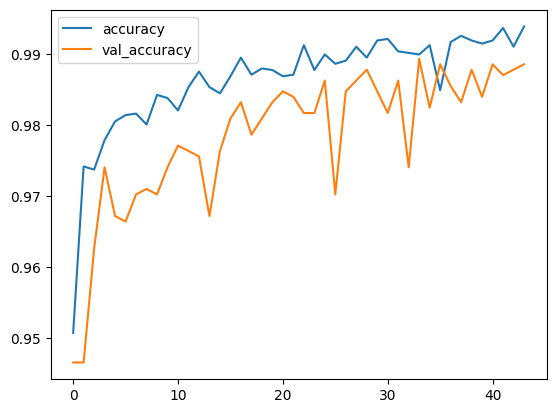

In [ ]:
df_inception[["accuracy","val_accuracy"]].plot();

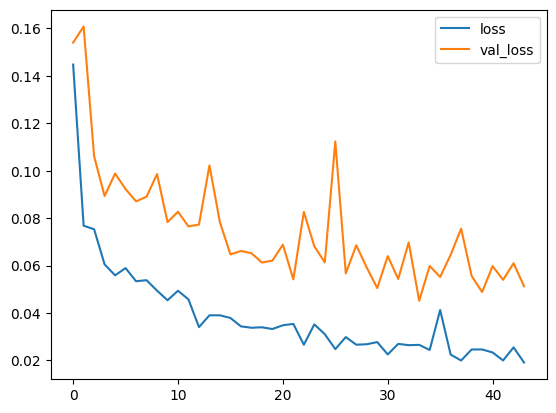

In [ ]:
df_inception[["loss","val_loss"]].plot();

In [ ]:
hist_=pd.DataFrame(r.history)
hist_

,accuracy,auc_1,loss,specificity_at_sensitivity_1,val_accuracy,val_auc_1,val_loss,val_specificity_at_sensitivity_1
0,0.950766,0.985579,0.144769,0.995405,0.946606,0.985667,0.154019,0.996949
1,0.974179,0.995657,0.076814,0.999344,0.946606,0.984415,0.160834,0.992372
2,0.973742,0.995553,0.075311,0.998687,0.962624,0.991225,0.106067,0.996186
3,0.977899,0.997574,0.060493,0.999781,0.974066,0.993460,0.089326,0.998474
4,0.980525,0.997449,0.055877,0.999344,0.967201,0.992072,0.098811,0.996186
5,0.981400,0.997132,0.058934,0.999125,0.966438,0.992628,0.092253,0.996949
6,0.981619,0.997334,0.053384,0.998906,0.970252,0.993474,0.087079,0.996949
7,0.980088,0.997618,0.053829,0.999344,0.971014,0.993156,0.089031,0.996186
8,0.984245,0.997985,0.049428,0.999344,0.970252,0.992205,0.098578,0.995423
9,0.983807,0.998372,0.045368,0.999562,0.974066,0.993723,0.078332,0.996186


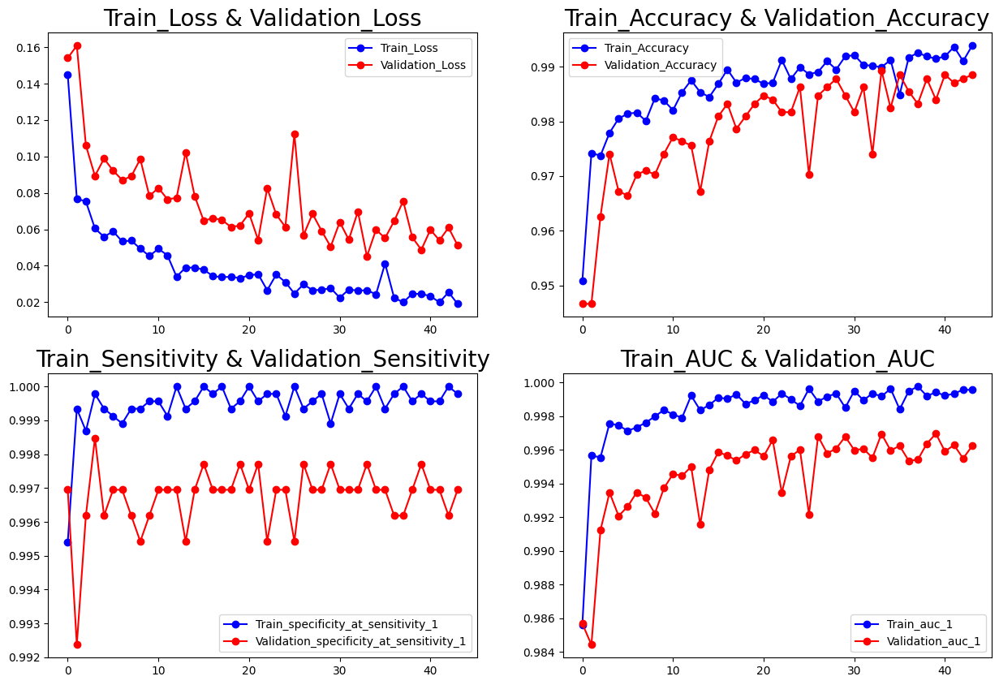

In [ ]:
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.plot(hist_['loss'],'b-o',label='Train_Loss')
plt.plot(hist_['val_loss'],'r-o',label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(2,2,2)
plt.plot(hist_['accuracy'],'b-o',label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],'r-o',label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.subplot(2,2,3)
plt.plot(hist_['specificity_at_sensitivity_1'],'b-o',label='Train_specificity_at_sensitivity_1')
plt.plot(hist_['val_specificity_at_sensitivity_1'],'r-o',label='Validation_specificity_at_sensitivity_1')
plt.title('Train_Sensitivity & Validation_Sensitivity',fontsize=20)
plt.legend()
plt.subplot(2,2,4)
plt.plot(hist_['auc_1'],'b-o',label='Train_auc_1')
plt.plot(hist_['val_auc_1'],'r-o',label='Validation_auc_1')
plt.title('Train_AUC & Validation_AUC',fontsize=20)
plt.legend()
plt.show()

In [ ]:
score,acc,sensitivity,auc= model2.evaluate(test_set2)
print('Test Loss =', score)
print('Test Accuracy =', acc)
print('Test Sensitivity =', sensitivity)
print('Test AUC =', auc)

55/55 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9722 - auc_1: 0.9831 - loss: 0.1495 - specificity_at_sensitivity_1: 0.9892
Test Loss = 0.051261674612760544
Test Accuracy = 0.9885583519935608
Test Sensitivity = 0.9969488978385925
Test AUC = 0.9962332844734192


In [ ]:
y_test2 =test_set2.classes
predictions = model2.predict(test_set2)

# Find the class with the highest predicted probability for each sample
y_pred2 = np.argmax(predictions, axis=1)

y_test2 = np.ravel(y_test2)
df = pd.DataFrame({'Actual': y_test2, 'Prediction': y_pred2})
print(df)

55/55 ━━━━━━━━━━━━━━━━━━━━ 19s 213ms/step
      Actual  Prediction
0          0           1
1          0           0
2          0           0
3          0           0
4          0           0
...      ...         ...
1306       1           1
1307       1           1
1308       1           1
1309       1           1
1310       1           1

[1311 rows x 2 columns]


In [ ]:


 y_test2[100]


0

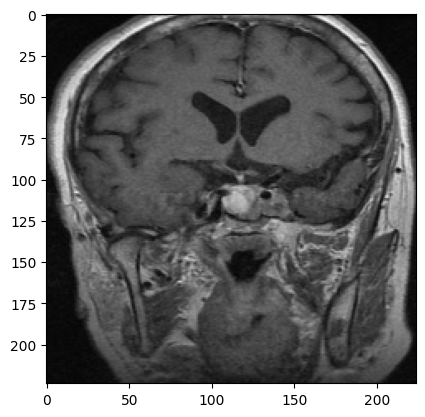

In [ ]:
import matplotlib.pyplot as plt

# Iterate through the dataset to access the 100th image
i = 0
for image, label in test_set2:
    if i == 100:
        plt.imshow(image[0])  # Assuming image is in a batch format
        plt.show()
        break
    i += 1

In [ ]:
y_pred2[100]

0

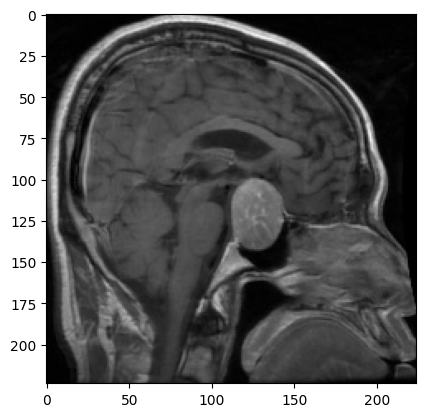

In [ ]:
import matplotlib.pyplot as plt

# Iterate through the dataset to access the 100th image
i = 0
for image, label in test_set2:
    if i == 0:
        plt.imshow(image[0])  # Assuming image is in a batch format
        plt.show()
        break
    i += 1

In [ ]:
y_pred2[0]

1

array([[395,  10],
       [  5, 901]])

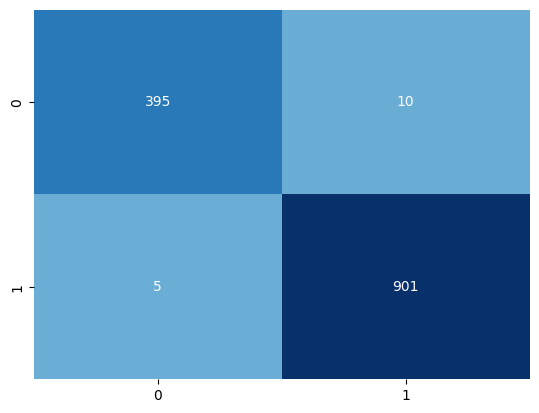

In [ ]:
CM = confusion_matrix(y_test2,y_pred2)
sns.heatmap(CM,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [ ]:
ClassificationReport = classification_report(y_test2,y_pred2)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       0.99      0.98      0.98       405
           1       0.99      0.99      0.99       906

    accuracy                           0.99      1311
   macro avg       0.99      0.98      0.99      1311
weighted avg       0.99      0.99      0.99      1311

